# Labeling한 data 불러오기
### 직접 labeling (roboflow)
### class number : 3
- 0. scratch (긁힘 & 페인트 벗겨짐)
- 1. dent (찌그러짐)
- 2. crack (접합부위 벌어짐 & 깨짐)

### Img size : 416*416
### Augmentation 진행
- brightness (+-20%)
- blur (0.5px)
- rotate 90도 & 
- train image에 대해 X3 만큼 augmentation (3136장)
<br>

### Train Test 분리
- Train : 약 3000장 (96%)
- Test : 136장 (4%)

In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="xNMkS34ErtRdHYRNw50P")
project = rf.workspace("kyle9909").project("socar_hackerthon")
dataset = project.version(2).download("yolov5")

# YoloV5 설치

In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks/

/content/drive/MyDrive/Colab Notebooks


In [ ]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 12281, done.
remote: Total 12281 (delta 0), reused 0 (delta 0), pack-reused 12281
Receiving objects: 100% (12281/12281), 12.02 MiB | 9.32 MiB/s, done.
Resolving deltas: 100% (8475/8475), done.


In [ ]:
%cd /content/drive/MyDrive/Colab_Notebooks/yolov5
!pip install -r requirements.txt

# Train&Val data dir 설정

In [2]:
# yaml파일에서 trian, val 경로를 수정해야함
%cat /content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/Socar_Hackerthon-2/data.yaml

names:
- crack
- dent
- scratch
nc: 3
train: Socar_Hackerthon-2/train/images
val: Socar_Hackerthon-2/valid/images


In [ ]:
%cd /
from glob import glob

img_list = glob('/content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/Socar_Hackerthon-2/train/images*.jpg')

print(len(img_list))

/
2989


In [ ]:
# Train --> train&val (8:2)
from sklearn.model_selection import train_test_split

train_img_list, val_img_list = train_test_split(img_list, test_size=0.2, random_state=29)

In [ ]:
# 각 이미지들의 경로를 저장해줌
with open('/content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/train.txt','w') as f:
  f.write('\n'.join(train_img_list)+'\n')

with open('/content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/val.txt','w') as f:
  f.write('\n'.join(val_img_list)+'\n')

In [ ]:
import yaml

with open('/content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/Socar_Hackerthon-2/data.yaml', 'r') as f:
  data = yaml.load(f,Loader=yaml.FullLoader)

print(data)

data['train'] = '/content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/train.txt'
data['val'] = '/content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/val.txt'

with open('/content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/Socar_Hackerthon-2/data.yaml','w') as f:
  yaml.dump(data,f)


print(data)

{'names': ['crack', 'dent', 'scratch'], 'nc': 3, 'train': 'Socar_Hackerthon-2/train/images', 'val': 'Socar_Hackerthon-2/valid/images'}
{'names': ['crack', 'dent', 'scratch'], 'nc': 3, 'train': '/content/dataset/train.txt', 'val': '/content/dataset/val.txt'}


# YoloV5 학습
- yolov5s (small) 사용
- pretrained 모델 : yolov5s.pt
- 100 epoch / 16 batch size
- 저장 이름 : socar_hackathon_yolo5
<br>

### train log 의미
- box & obj & cls : 각 
- P(precision) : 모델이 예측한 결과의 positive가 얼마나 정확한지 (예측 중 옳게 예측한 비율)
- R(recall) : 모델이 예측한 결과가 positive를 얼마나 잘 찾는지 (실제 옳은 것 중 옳게 예측한 비율)
- mAP : 각각 pascalVOC, coco의 mAP 점수



In [ ]:
%cd /content/drive/MyDrive/Colab_Notebooks/yolov5

/content/drive/MyDrive/Colab_Notebooks/yolov5


In [ ]:
! python train.py --img 416 --batch 16 --epochs 100 --data /content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/Socar_Hackerthon-2/data.yaml --cfg ./models/yolov5s.yaml --weight yolov5s.pt --name socar_hackathon_yolov5


train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/dataset/Socar_Hackerthon-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=socar_hackathon_yolov5, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-261-g19f33cb Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0

# 결과 확인
- 50epoch 했을 때, 성능이 계속 향상됨 (loss가 계속 감소) ==> 100 epoch으로 증가 <br>
- socar_hackathon_yolov5로 저장
:: /content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5/weights/best.pt

In [ ]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5

<IPython.core.display.Javascript object>

## Tensorboard 결과
- mAP, P, R 모두 학습이 진행될수록 증가하는 모습 <br>

- Train 뿐만 아니라 Validation data 에서도 loss가 계속 감소
- 나중에 심화시킨다면 epoch수를 더 증가시킬 수도 있을 것 같음

# Test


## Test data 불러오기


In [17]:
# Test data directory 설정
from PIL import Image
from glob import glob
import os

test_img_list = glob('/content/drive/MyDrive/Colab_Notebooks/멋사쏘카2기/Hackathon/Socar_Hackerthon-2/test/images/*.jpg')

In [5]:
# 136개 test image
len(test_img_list)

136

## Model 적용
- 100epoch 학습 후 best model 불러오기 <br>

- confidence level : 0.3
- /content/drive/MyDrive/Colab_Notebooks/yolov5/runs/detect 에 저장

In [ ]:
%cd /content/drive/MyDrive/Colab_Notebooks/yolov5

for test_img in test_img_list:
  !python detect.py --weight /content/drive/MyDrive/Colab_Notebooks/yolov5/runs/train/socar_hackathon_yolov5/weights/best.pt --img 416 --conf 0.3 --source "{test_img}" 

## 이미지 시각화

In [7]:
from glob import glob

In [8]:
inf_test = glob('/content/drive/MyDrive/Colab_Notebooks/yolov5/runs/detect/*/*.jpg')

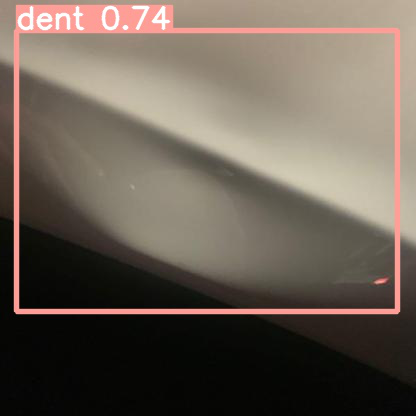

In [9]:
Image.open(inf_test[0], 'r')

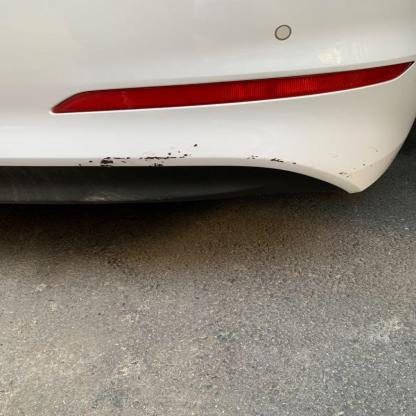

In [19]:
Image.open(inf_test[1], 'r')

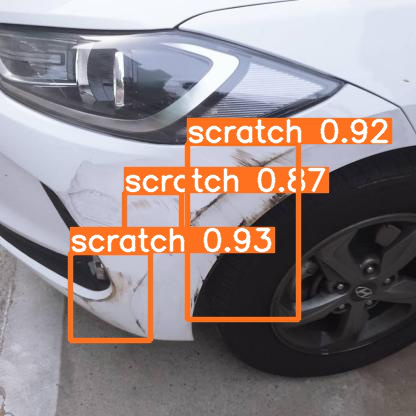

In [11]:
Image.open(inf_test[50], 'r')

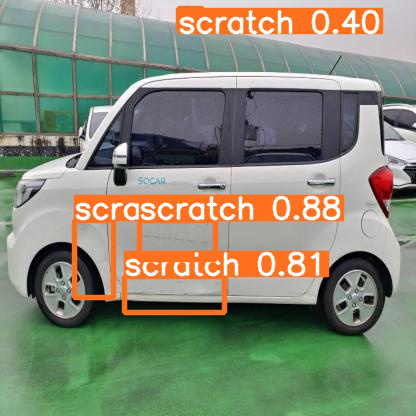

In [20]:
# 하늘에 scratch --> conf 수준을 높이면 개선될듯?
Image.open(inf_test[74], 'r')

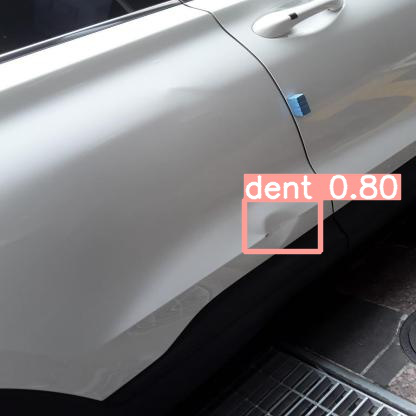

In [23]:
Image.open(inf_test[100], 'r')

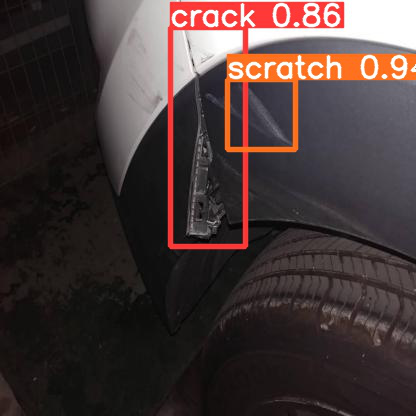

In [12]:
Image.open(inf_test[128], 'r')

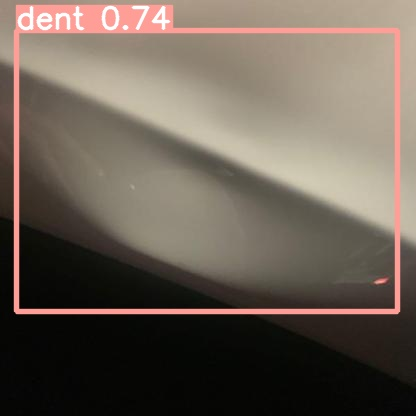

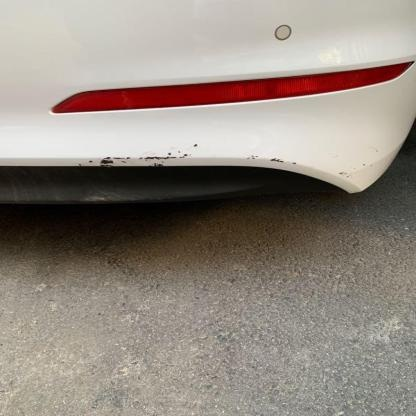

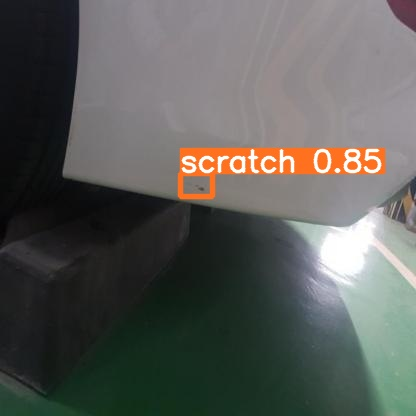

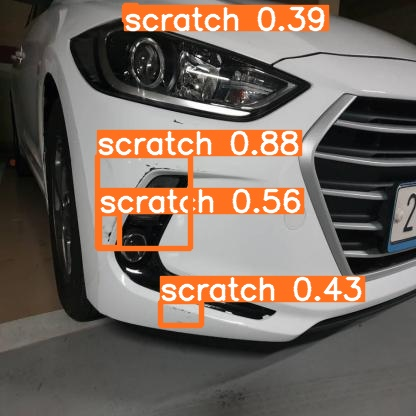

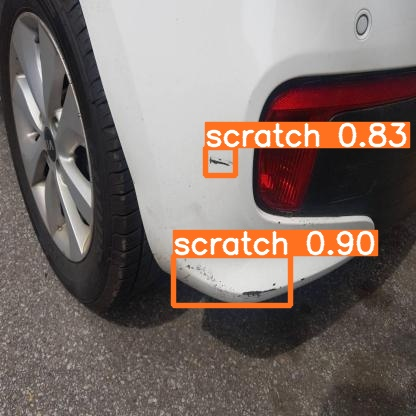

...

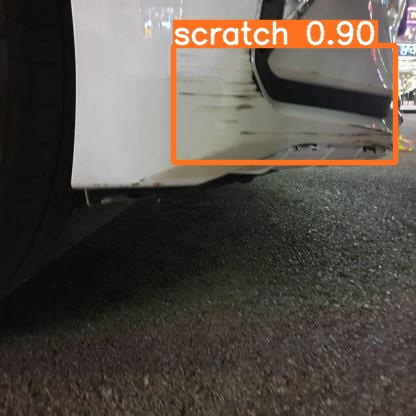

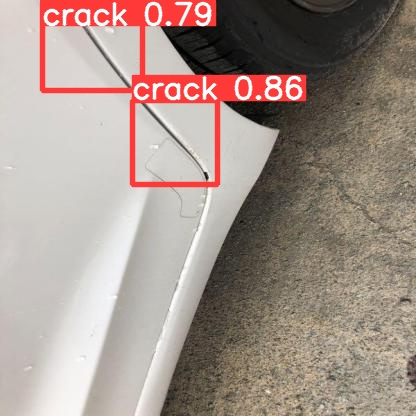

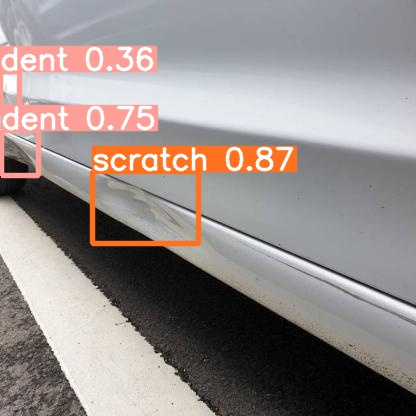

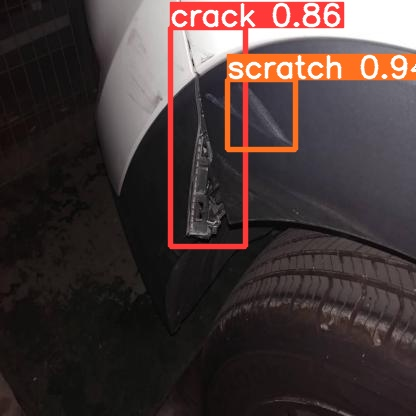

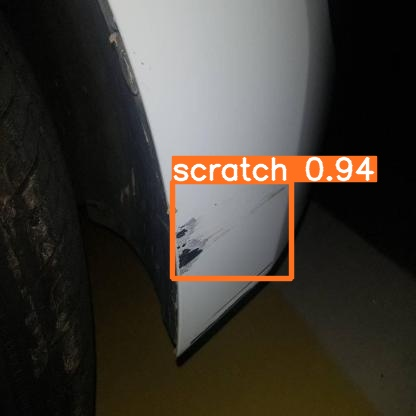

In [13]:
from IPython.display import Image, display

for imageName in inf_test:
    display(Image(filename=imageName))

Damage를 인식하지 못하거나 Scratch를 Crack이나 Dent으로 인식하는 등 정확하지 않은 부분은 있음 <br>
- 아무래도 crack이나 dent의 데이터가 scratch보다 적기 때문에 학습이 제대로 안되었을 수 있음
- train&val&test data 분리할때 분포 고려하지 않고 나눠서 그럴 수도 있음

but 모델을 더 개선시키고 학습을 더 시키고, 무거운 모델로 구성하면 정확도도 높아질듯